# Demo: Use a model

Author: Jim Xie

Date: 2020-08-07

!pip install scipy==1.1.0

In [10]:
import os,cv2,sys,copy
from scipy import misc
root_path = "/Users/jim/Desktop/Sharing/AICourse/face/image/"
os.chdir(root_path+"../facenet/src/")
sys.path.append("./")
from mtcnn import MTCNN
from face_align import face_preprocess
from warnings import filterwarnings
filterwarnings('ignore')
from matplotlib import pyplot as plt
%matplotlib inline
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import numpy as np
import facenet.src.facenet as facenet
import align.detect_face

In [11]:
class CCEShare:

    def __init__(self,file_name):
        self.m_mtcnn = MTCNN(root_path+'../models/mtcnn.pb')
        self.m_raw_img = cv2.imread(root_path+file_name+".jpg")

    def Detect(self):
        bbox, scores, landmarks = self.m_mtcnn.detect(self.m_raw_img)
        return bbox.astype('int32'),landmarks.astype('int32')

    def DrawBox(self,bbox):
        for box in bbox:
            self.m_raw_img = cv2.rectangle(self.m_raw_img, (box[1], box[0]), (box[3], box[2]), (255, 0, 0), 5)

    def DrawLandMark(self,landmarks):
        for pts in landmarks:
            for i in range(5):
                self.m_raw_img = cv2.circle(self.m_raw_img, (pts[i+5], pts[i]), 5, (0, 255, 0), -1)

    def SaveImg(self,file_name):
        (filename, extension) = os.path.splitext(file_name)
        cv2.imwrite(root_path+filename+".jpg",self.m_raw_img)
        

In [12]:
def process_mtcnn(imgpath):
    (filename, extension) = os.path.splitext(imgpath)
    share = CCEShare(imgpath)
    bbox, landmarks = share.Detect()
    share.DrawBox(bbox)
    share.SaveImg(filename+"-1.jpg")
    share.DrawLandMark(landmarks)
    share.SaveImg(filename+"-2.jpg")

def process_align(imgpath):
    image_array = cv2.imread(root_path+imgpath+".jpg")
    face,landmarks = face_preprocess(image = image_array,landmark_model_type='large',crop_size=640)
    mark_face = face.copy()
    for key in landmarks:
        for ps in landmarks[key]:
            cv2.circle(mark_face,ps,3,(0,255,0),-1)
    cv2.imwrite(root_path+imgpath+"-3.jpg",mark_face)
    cv2.imwrite(root_path+imgpath+"-4.jpg",face)

In [13]:
def GetFeatures(file_name):
    fname = root_path + file_name + ".jpg"
    image_size = 160
    margin = 44
    gpu_memory_fraction = -1
    model = root_path + "../models/20180402-114759.pb"
    with tf.Graph().as_default():
        with tf.Session() as sess:
            images = load_and_align_data(sess,[fname],image_size,margin,gpu_memory_fraction)
            facenet.load_model(model)
            images_placeholder = tf.get_default_graph().get_tensor_by_name("input:0")
            embeddings = tf.get_default_graph().get_tensor_by_name("embeddings:0")
            phase_train_placeholder = tf.get_default_graph().get_tensor_by_name("phase_train:0")
            feed_dict = { images_placeholder: images, phase_train_placeholder:False }
            emb = sess.run(embeddings, feed_dict=feed_dict)
            if len(emb) > 0:
                return emb[0]
            else:
                return None

In [14]:
def load_and_align_data(sess,image_paths, image_size, margin, gpu_memory_fraction):
    minsize = 20
    threshold = [ 0.6, 0.7, 0.7 ]
    factor = 0.709
    
    pnet, rnet, onet = align.detect_face.create_mtcnn(sess, None)
  
    tmp_image_paths=copy.copy(image_paths)
    img_list = []
    for image in tmp_image_paths:
        img = misc.imread(os.path.expanduser(image), mode='RGB')
        img_size = np.asarray(img.shape)[0:2]
        bounding_boxes, _ = align.detect_face.detect_face(img, minsize, pnet, rnet, onet, threshold, factor)
        if len(bounding_boxes) < 1:
          image_paths.remove(image)
          print("can't detect face, remove ", image)
          continue
        det = np.squeeze(bounding_boxes[0,0:4])
        bb = np.zeros(4, dtype=np.int32)
        bb[0] = np.maximum(det[0]-margin/2, 0)
        bb[1] = np.maximum(det[1]-margin/2, 0)
        bb[2] = np.minimum(det[2]+margin/2, img_size[1])
        bb[3] = np.minimum(det[3]+margin/2, img_size[0])
        cropped = img[bb[1]:bb[3],bb[0]:bb[2],:]
        aligned = misc.imresize(cropped, (image_size, image_size), interp='bilinear')
        prewhitened = facenet.prewhiten(aligned)
        img_list.append(prewhitened)
    images = np.stack(img_list)
    return images

In [15]:
def GetFaceFeature(fileName):
    process_mtcnn(fileName)
    process_mtcnn(fileName)
    process_align(fileName)
    feature = GetFeatures(fileName+"-4")
    img0= cv2.imread(root_path+fileName+".jpg")
    img0= cv2.cvtColor(img0.copy(),cv2.COLOR_BGR2RGB)
    img1= cv2.imread(root_path+fileName+"-1.jpg")
    img1= cv2.cvtColor(img1.copy(),cv2.COLOR_BGR2RGB)
    img2= cv2.imread(root_path+fileName+"-2.jpg")
    img2= cv2.cvtColor(img2.copy(),cv2.COLOR_BGR2RGB)
    img3= cv2.imread(root_path+fileName+"-3.jpg")
    img3= cv2.cvtColor(img3.copy(),cv2.COLOR_BGR2RGB)
    img4= cv2.imread(root_path+fileName+"-4.jpg")
    img4= cv2.cvtColor(img4.copy(),cv2.COLOR_BGR2RGB)
    return feature,img0,img1,img2,img3,img4

Model filename: /Users/jim/Desktop/Sharing/AICourse/face/image/../models/20180402-114759.pb
Model filename: /Users/jim/Desktop/Sharing/AICourse/face/image/../models/20180402-114759.pb
Model filename: /Users/jim/Desktop/Sharing/AICourse/face/image/../models/20180402-114759.pb


array([ 6.45104870e-02,  2.84561850e-02, -7.34514222e-02, -1.72762796e-02,
        1.13835093e-02, -1.63213350e-02, -5.34696728e-02,  5.32028638e-02,
       -1.44749386e-02,  3.59034501e-02,  1.85653623e-02,  5.90951703e-02,
        1.47779640e-02, -2.17743292e-02,  1.50234122e-02,  2.69741509e-02,
        9.79373977e-03,  6.51236624e-02, -4.73311683e-03,  1.31187737e-02,
        1.93645954e-02,  7.57418424e-02, -2.74137706e-02,  1.94943268e-02,
       -5.75505616e-03,  7.68123753e-03, -1.67304382e-03, -4.68759239e-02,
       -7.83462636e-03,  1.86435096e-02,  6.26648515e-02, -2.79785655e-02,
        6.60447776e-02,  7.25395456e-02,  3.40714492e-02, -3.05157676e-02,
        2.18674410e-02, -3.11621316e-02,  6.31265938e-02,  1.90785564e-02,
       -3.54125723e-02, -8.98810104e-02, -8.88273865e-03,  8.27946793e-03,
       -7.42506757e-02,  6.32991269e-02, -5.85555471e-02, -3.11240125e-02,
        7.45609356e-03,  3.36035453e-02, -3.36385705e-02, -3.62228043e-02,
       -2.25111656e-02, -

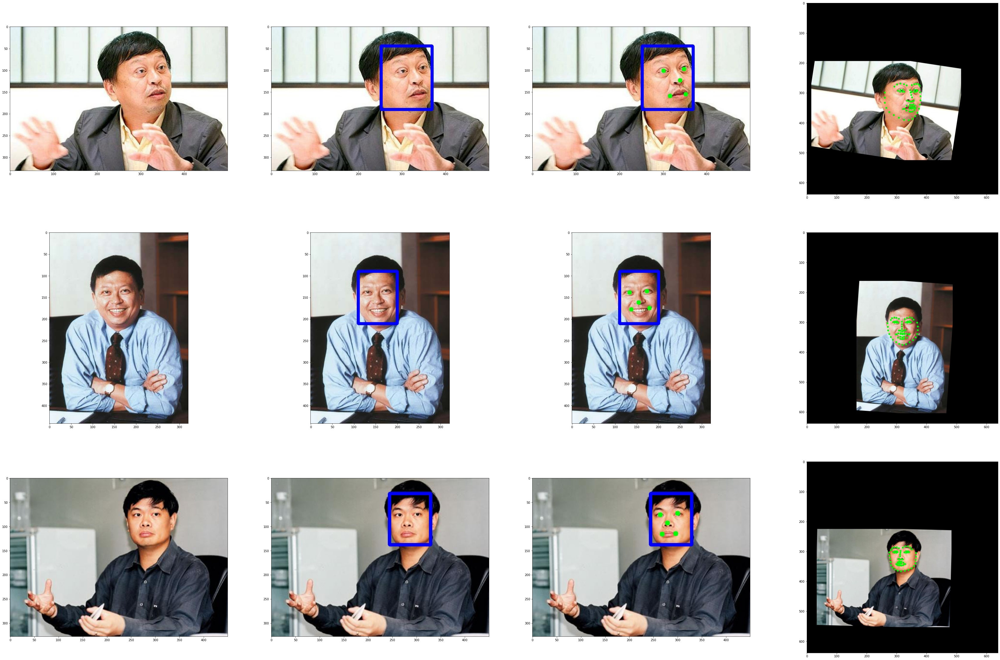

In [16]:
img_list = ['face1','face2','face3']
result_list = []
fig,ax = plt.subplots(3,4,figsize=(60,40))
count = 0
for f in img_list:
    feature,img0,img1,img2,img3,img4 = GetFaceFeature(f)
    result_list.append((feature,img0,img1,img2,img3,img4))
    plt.subplot(3,4,count + 1)
    count += 1
    plt.imshow(img0)
    plt.subplot(3,4,count + 1)
    count += 1
    plt.imshow(img1)
    plt.subplot(3,4,count + 1)
    count += 1
    plt.imshow(img2)
    plt.subplot(3,4,count + 1)
    count += 1
    plt.imshow(img3)
    
f1 = result_list[0][0]
f2 = result_list[1][0]
f3 = result_list[2][0]
i1 = result_list[0][1]
i2 = result_list[1][1]
i3 = result_list[2][1]
j1 = result_list[0][4]
j2 = result_list[1][4]
j3 = result_list[2][4]
feature1 = cv2.imread(root_path+"feature1.jpg")
feature1 = cv2.cvtColor(feature1.copy(),cv2.COLOR_BGR2RGB)
feature2 = cv2.imread(root_path+"feature2.jpg")
feature2 = cv2.cvtColor(feature2.copy(),cv2.COLOR_BGR2RGB)
feature3 = cv2.imread(root_path+"feature3.jpg")
feature3 = cv2.cvtColor(feature1.copy(),cv2.COLOR_BGR2RGB)
f1

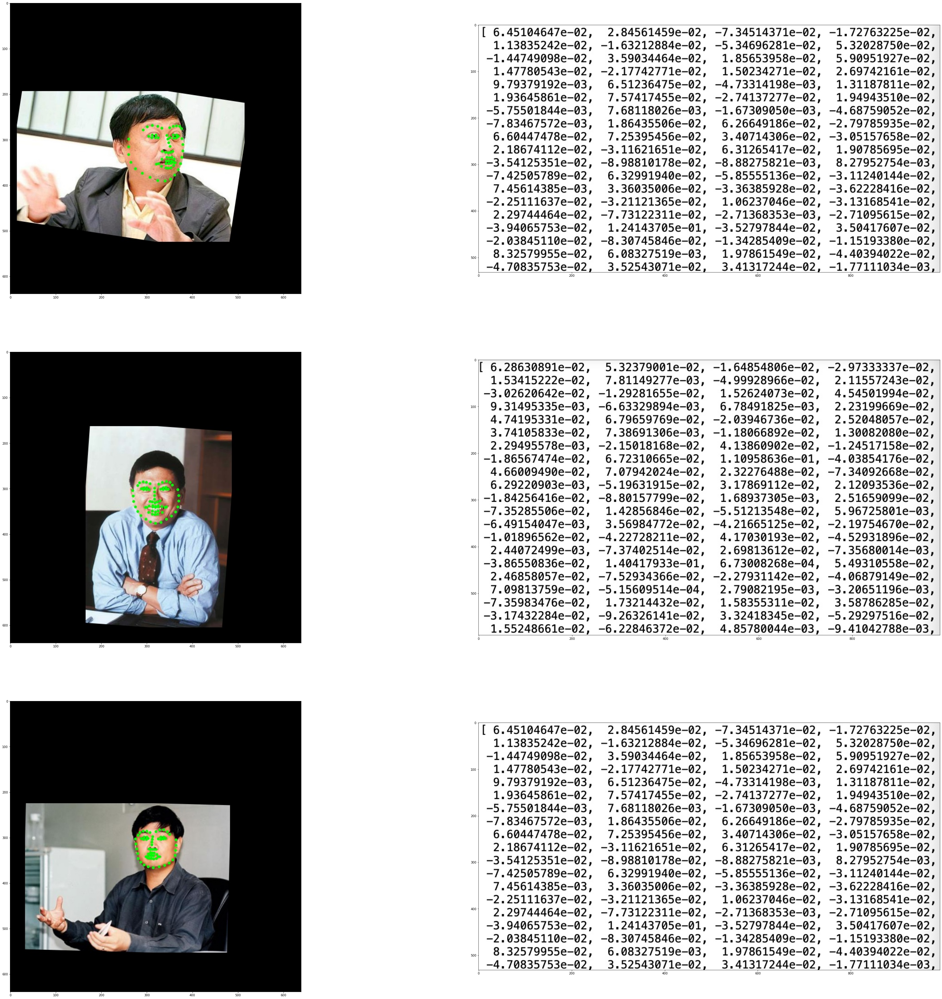

In [17]:
fig,ax = plt.subplots(3,2,figsize=(60,60))
plt.subplot(3,2,1)
plt.imshow(j1)
plt.subplot(3,2,2)
plt.imshow(feature1)
plt.subplot(3,2,3)
plt.imshow(j2)
plt.subplot(3,2,4)
plt.imshow(feature2)
plt.subplot(3,2,5)
plt.imshow(j3)
plt.subplot(3,2,6)
plt.imshow(feature3)

0.6274158 1.09349 0.98984516


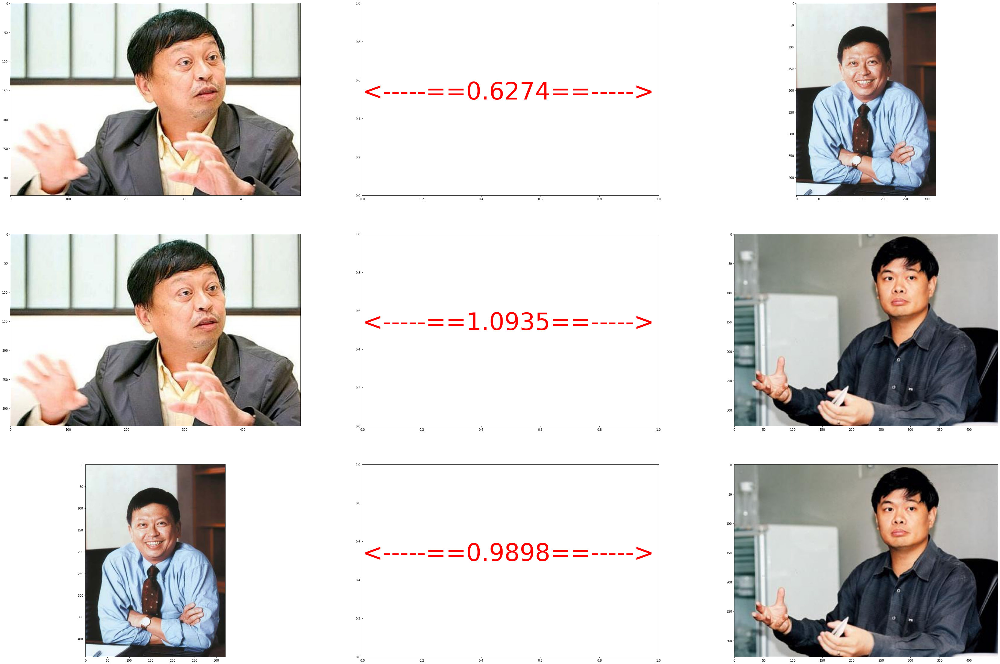

In [18]:
dist1 = np.sqrt(np.sum(np.square(np.subtract(f1, f2))))
dist2 = np.sqrt(np.sum(np.square(np.subtract(f1, f3))))
dist3 = np.sqrt(np.sum(np.square(np.subtract(f2, f3))))
print(dist1,dist2,dist3)
fig,ax = plt.subplots(3,3,figsize=(60,40))
plt.subplot(3,3,1)
plt.imshow(i1)
plt.subplot(3,3,2)
plt.text(0,0.5,'<-----==%.4f==----->'%dist1,fontdict={'size': 80, 'color':  'red'})
plt.subplot(3,3,3)
plt.imshow(i2)

plt.subplot(3,3,4)
plt.imshow(i1)
plt.subplot(3,3,5)
plt.text(0,0.5,'<-----==%.4f==----->'%dist2,fontdict={'size': 80, 'color':  'red'})
plt.subplot(3,3,6)
plt.imshow(i3)

plt.subplot(3,3,7)
plt.imshow(i2)
plt.subplot(3,3,8)
plt.text(0,0.5,'<-----==%.4f==----->'%dist3,fontdict={'size': 80, 'color':  'red'})
plt.subplot(3,3,9)
plt.imshow(i3)